### IMPORT SECTION

In [1]:
import importlib
import datetime as dt

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import numpy as np

import pandas as pd

from scipy import stats

import plotly.graph_objects as ptly
import plotly.express as px

import waldluft as wl

plt.style.use("janjo-v0-0.mplstyle")

In [2]:
px.line?

In [2]:
importlib.reload(wl)

<module 'waldluft' from '/Users/Janjo/Documents/MEINE DOKUMENTE/Projects/kaltluftstrom/waldluft.py'>

In [3]:
SENSOR_LABELS = {
    "W1": "W1: Schneise 1",
    "W6": "W6: Ref. Waldrand 1",
    "W7": "W7: Ref. Waldrand 2",
    "W8": "W8: Ref. Quartier",
    "W9": "W9: Ref. Wald",
    "S8": "S8: Ref. Quartier",
    "S9": "S9: Ref. Wald",
}
SENSORS = ("W1", "W2", "W3", "W4", "W5")
REF_SENSORS = ("W6", "W7", "W8", "W9")

### TIMESERIES

In [4]:
inst = wl.Timed(
    "raw_data/220905",
    encoding="iso8859-1",
    sensor_labels=SENSOR_LABELS,
)

Successfully imported the following sensor data:
    WTDL:
        W6
        W7
        W5
        W4
        W1
        W3
        W2
        W9
        W8
    SHT:
        S1  98:2B
        S3  A5:6D
        S2  B1:5B
        S7  79:D0
        S9  CD:A2
        S8  E1:E1


In [5]:
inst.plot_temp_time_interactive(*REF_SENSORS)

In [6]:
inst.plot_temp_time_interactive("W8", "W9")

28.154175000000002
image was saved at graphics_report/Tropennacht_4._August_2022_Ermittlung_Tages-Referenztemperatur_W6W7W8W9_size-10-6.pdf
image was saved at graphics_report/Tropennacht_4._August_2022_Ermittlung_Tages-Referenztemperatur_W6W7W8W9_size-10-6.png
image was saved at graphics_report/Tropennacht_4._August_2022_Ermittlung_Tages-Referenztemperatur_W6W7W8W9_size-10-6.svg


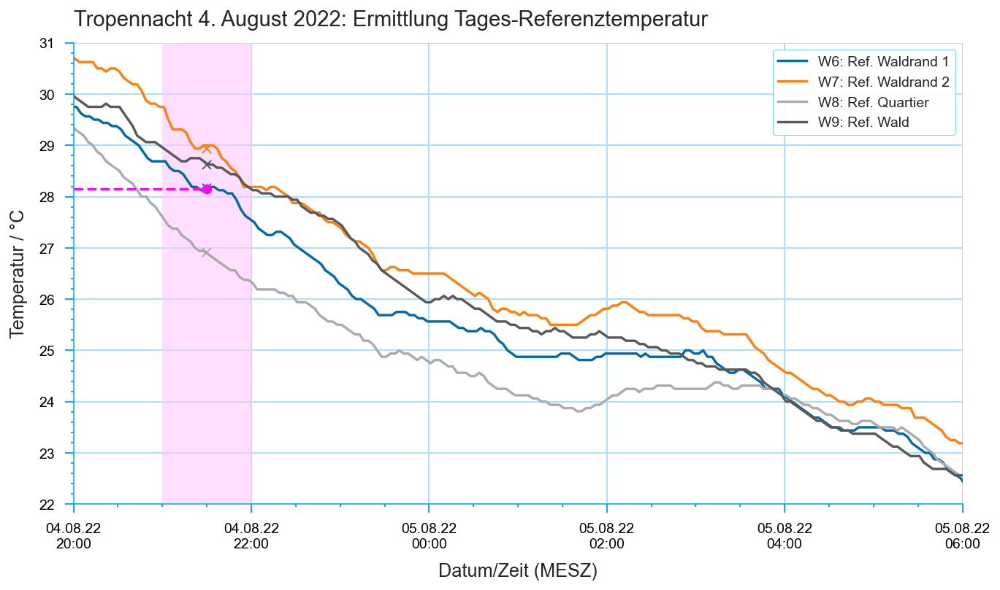

In [7]:
# Grafik 1: Ermittlung Tages-Referenztemperatur

# xrange: 20-6 => 10h

means_1 = (
    inst.timeseries["W6"].loc[dt.datetime(2022,8,4,21):dt.datetime(2022,8,4,22), "T"].mean(),
    inst.timeseries["W7"].loc[dt.datetime(2022,8,4,21):dt.datetime(2022,8,4,22), "T"].mean(),
    inst.timeseries["W8"].loc[dt.datetime(2022,8,4,21):dt.datetime(2022,8,4,22), "T"].mean(),
    inst.timeseries["W9"].loc[dt.datetime(2022,8,4,21):dt.datetime(2022,8,4,22), "T"].mean(),
)
mean_1 = sum(means_1) / len(means_1)
print(mean_1)

def annot_func_fig_2(fig, ax):
    plt.axvspan(
        xmin=dt.datetime(2022,8,4,21),
        xmax=dt.datetime(2022,8,4,22),
        color="#ffc9ff",
        alpha=0.6,
    )
    plt.axhline(mean_1, 0, 0.15, ls="--", c="#ff05ff")
    
    for c in range(4):
        ax.plot(dt.datetime(2022,8,4,21,30), means_1[c], "x", c="C"+str(c))
    #ax.plot([dt.datetime(2022,8,4,21,30),]*4, means_1, "x", c=(1,2,3,4))
    ax.plot(dt.datetime(2022,8,4,21,30), mean_1, "o", c="#ff05ff")
    
    ax.set_xticks([
        dt.datetime(2022,8,4,20) + dt.timedelta(hours=i*2)
        for i in range(6)
    ])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y\n%H:%M'))


    return fig, ax


inst.plot_temp_time(
    sensor_manual=REF_SENSORS,
    title="Tropennacht 4. August 2022: Ermittlung Tages-Referenztemperatur",
    fig_size=(10,6),
    xlim=(
        dt.datetime(2022,8,4,20),
        dt.datetime(2022,8,5,6),
    ),
    ylim=(22,31),
    annot_func=annot_func_fig_2,
    file_export_path="graphics_report",
    file_export=True,
    file_export_type=("pdf", "png", "svg",),
)

25.949761904761903 23.050761904761902
image was saved at graphics_report/Auslesung_standortspezifischer_Temperaturen_in_vordefinierten_Zeitbereichen_W1_size-10-6.pdf
image was saved at graphics_report/Auslesung_standortspezifischer_Temperaturen_in_vordefinierten_Zeitbereichen_W1_size-10-6.png
image was saved at graphics_report/Auslesung_standortspezifischer_Temperaturen_in_vordefinierten_Zeitbereichen_W1_size-10-6.svg


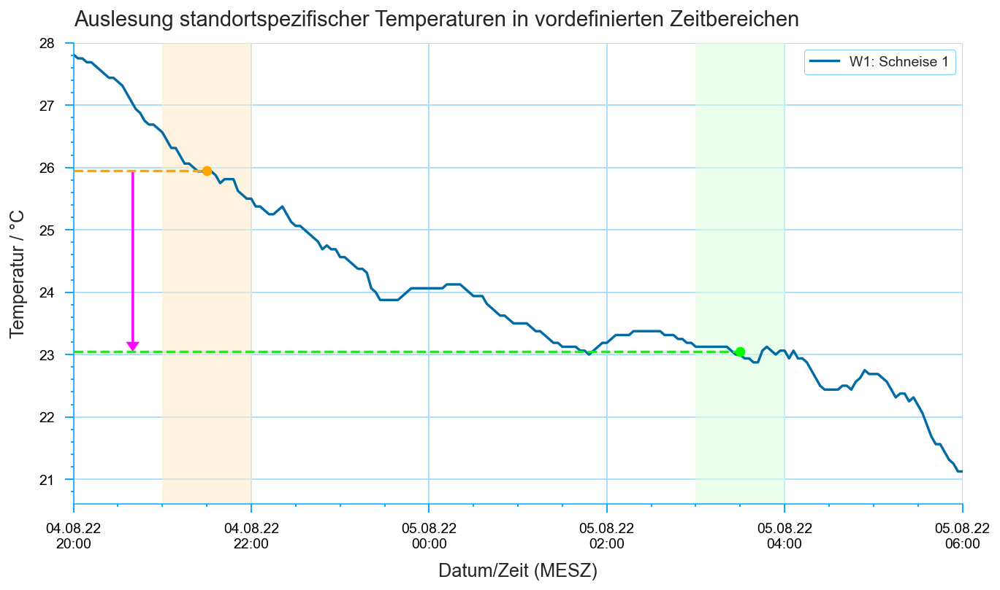

In [8]:
# Grafik 2: Auslesung standortspezifischer Temperaturen in vordefinierten Zeitbereichen

# xrange: 20-6 => 10h

mean_1 = inst.timeseries["W1"].loc[dt.datetime(2022,8,4,21):dt.datetime(2022,8,4,22), "T"].mean()
mean_2 = inst.timeseries["W1"].loc[dt.datetime(2022,8,5,3):dt.datetime(2022,8,5,4), "T"].mean()
print(mean_1, mean_2)

def annot_func_fig_2(fig, ax):
    plt.axvspan(
        xmin=dt.datetime(2022,8,4,21),
        xmax=dt.datetime(2022,8,4,22),
        color="#fcebcc",
        alpha=0.6,
    )
    plt.axvspan(
        xmin=dt.datetime(2022,8,5,3),
        xmax=dt.datetime(2022,8,5,4),
        color="#defcde",
        alpha=0.6,
    )
    plt.axhline(mean_1, 0, 0.15, ls="--", c="#ffa500")
    plt.axhline(mean_2, 0, 0.75, ls="--",  c="#05fc05")
    
    ax.plot(dt.datetime(2022,8,4,21,30), mean_1, "o", c="#ffa500")
    ax.plot(dt.datetime(2022,8,5, 3,30), mean_2, "o", c="#05fc05")
    
    plt.arrow(
        dt.datetime(2022,8,4,20,40),
        mean_1,
        0,
        (mean_2 - mean_1),
        width=0.001,
        length_includes_head=True,
        head_width=0.006,
        head_length=0.15,
        color="#ff05ff",
        edgecolor=None,
    )
    
    ax.set_xticks([
        dt.datetime(2022,8,4,20) + dt.timedelta(hours=i*2)
        for i in range(6)
    ])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y\n%H:%M'))

    return fig, ax


inst.plot_temp_time(
    sensor_type="wtdl",
    sensor_locations=(1,),
    title="Auslesung standortspezifischer Temperaturen in vordefinierten Zeitbereichen",
    fig_size=(10,6),
    xlim=(
        dt.datetime(2022,8,4,20),
        dt.datetime(2022,8,5,6),
    ),
    ylim=(20.6,28),
    annot_func=annot_func_fig_2,
    file_export_path="graphics_report",
    file_export=True,
    file_export_type=("pdf", "png", "svg", ),
)

image was saved at graphics_report/Vergleich_der_Abkühlung_im_Quartier_und_im_Wald_19._Juli_2022_W8W9_size-10-6.pdf
image was saved at graphics_report/Vergleich_der_Abkühlung_im_Quartier_und_im_Wald_19._Juli_2022_W8W9_size-10-6.png
image was saved at graphics_report/Vergleich_der_Abkühlung_im_Quartier_und_im_Wald_19._Juli_2022_W8W9_size-10-6.svg


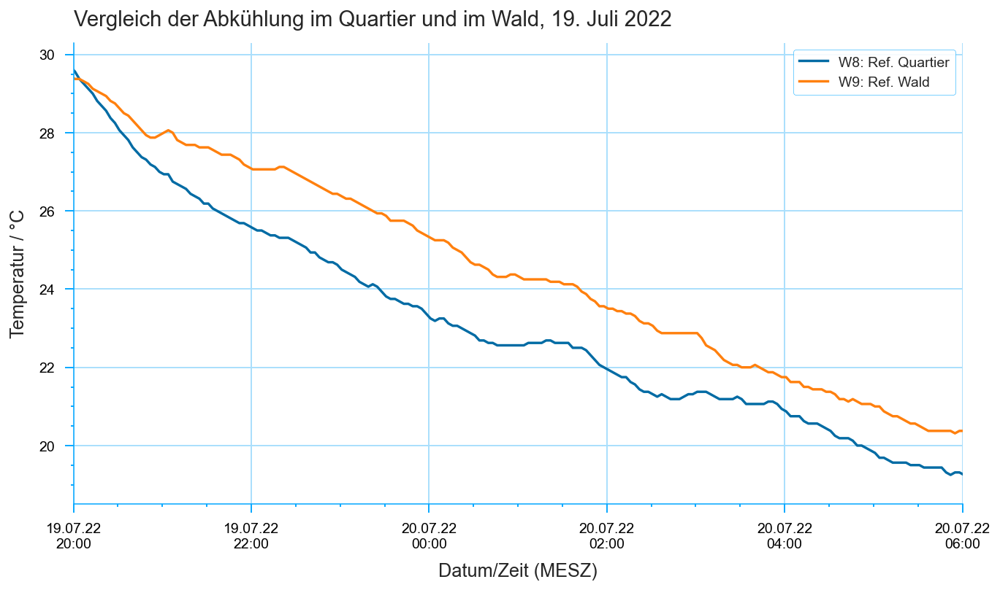

In [9]:
# Grafik 3: Stärkere Temperaturschwankungen im Quartier WTDL

# xrange: 20-6 => 10h

def annot_func_fig_3(fig, ax):    
    ax.set_xticks([
        dt.datetime(2022,7,19,20) + dt.timedelta(hours=i*2)
        for i in range(6)
    ])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y\n%H:%M'))

    return fig, ax


inst.plot_temp_time(
    sensor_manual=["W8", "W9"],
    title="Vergleich der Abkühlung im Quartier und im Wald, 19. Juli 2022",
    fig_size=(10,6),
    xlim=(
        dt.datetime(2022,7,19,20),
        dt.datetime(2022,7,20,6),
    ),
    ylim=(18.5,30.3),
    annot_func=annot_func_fig_3,
    file_export_path="graphics_report",
    file_export=True,
    file_export_type=("pdf", "png", "svg", ),
)

image was saved at graphics_report/Vergleich_der_Abkühlung_im_Quartier_und_im_Wald_19._Juli_2022_S8S9_size-10-6.pdf
image was saved at graphics_report/Vergleich_der_Abkühlung_im_Quartier_und_im_Wald_19._Juli_2022_S8S9_size-10-6.png
image was saved at graphics_report/Vergleich_der_Abkühlung_im_Quartier_und_im_Wald_19._Juli_2022_S8S9_size-10-6.svg


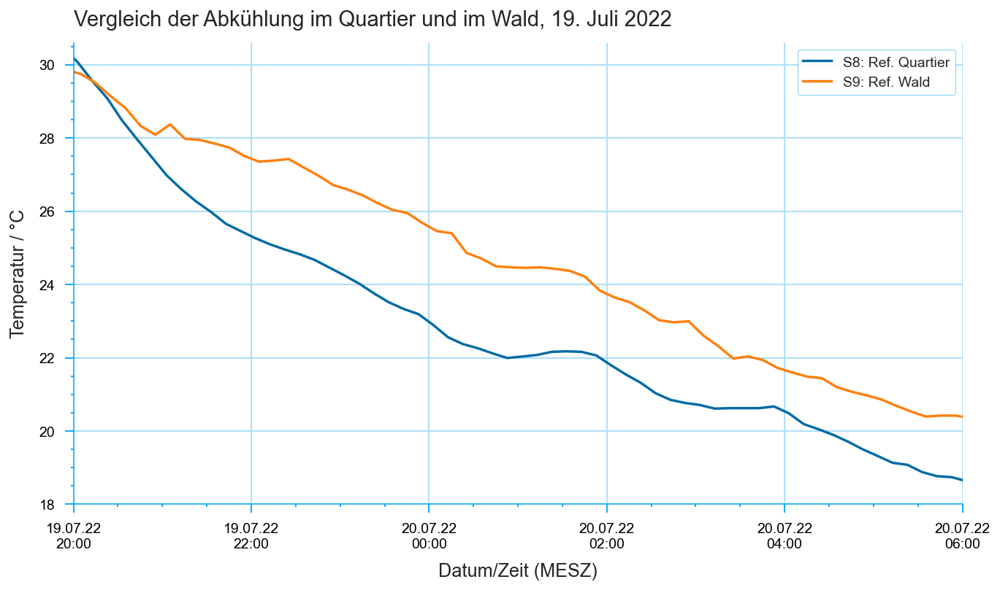

In [10]:
# Grafik 3: Stärkere Temperaturschwankungen im Quartier

# xrange: 20-6 => 10h

def annot_func_fig_3(fig, ax):    
    ax.set_xticks([
        dt.datetime(2022,7,19,20) + dt.timedelta(hours=i*2)
        for i in range(6)
    ])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y\n%H:%M'))

    return fig, ax


inst.plot_temp_time(
    sensor_manual=["S8", "S9"],
    title="Vergleich der Abkühlung im Quartier und im Wald, 19. Juli 2022",
    fig_size=(10,6),
    xlim=(
        dt.datetime(2022,7,19,20),
        dt.datetime(2022,7,20,6),
    ),
    ylim=(18,30.6),
    annot_func=annot_func_fig_3,
    file_export_path="graphics_report",
    file_export=True,
    file_export_type=("pdf", "png", "svg", ),
)

25.949761904761903 23.050761904761902


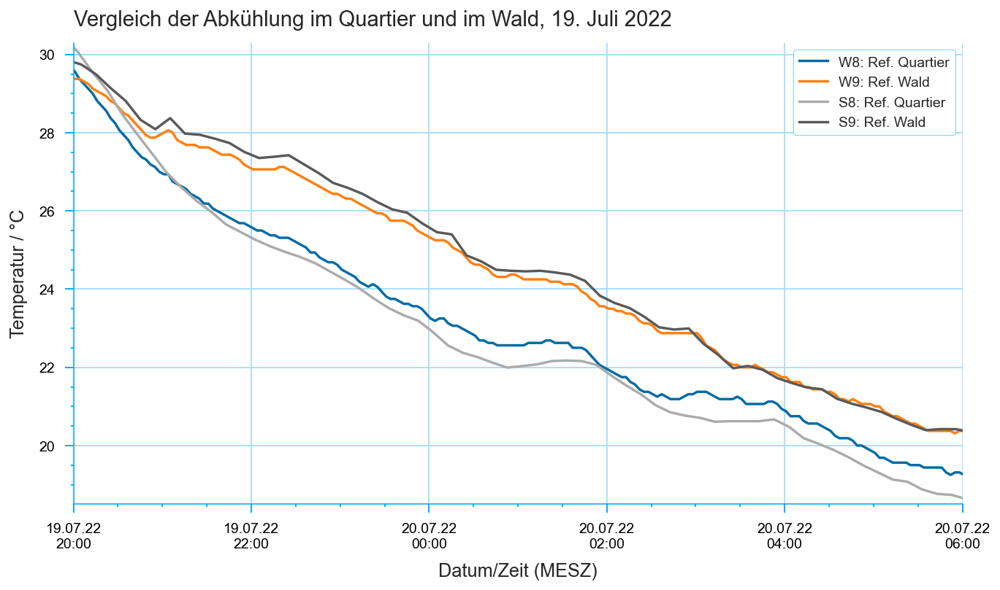

In [11]:
# Grafik 3: Stärkere Temperaturschwankungen im Quartier WTDL und SHT

# xrange: 20-6 => 10h

mean_1 = inst.timeseries["W1"].loc[dt.datetime(2022,8,4,21):dt.datetime(2022,8,4,22), "T"].mean()
mean_2 = inst.timeseries["W1"].loc[dt.datetime(2022,8,5,3):dt.datetime(2022,8,5,4), "T"].mean()
print(mean_1, mean_2)

def annot_func_fig_3(fig, ax):    
    ax.set_xticks([
        dt.datetime(2022,7,19,20) + dt.timedelta(hours=i*2)
        for i in range(6)
    ])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y\n%H:%M'))

    return fig, ax


inst.plot_temp_time(
    sensor_manual=["W8", "W9", "S8", "S9"],
    title="Vergleich der Abkühlung im Quartier und im Wald, 19. Juli 2022",
    fig_size=(10,6),
    xlim=(
        dt.datetime(2022,7,19,20),
        dt.datetime(2022,7,20,6),
    ),
    ylim=(18.5,30.3),
    annot_func=annot_func_fig_3,
    file_export_path="graphics_report",
    file_export=False,
    file_export_type=("pdf", "png", "svg", ),
)

### DATESERIES

In [12]:
dtd = wl.Dated(inst.timeseries)
dtd.assign_bins(REF_SENSORS)

image was saved at graphics_report/Temperaturabfall_nach_Tages-Referenztemperatur_mit_Regressionsanalyse_W1W2W3W4W5_size-10-6.pdf
image was saved at graphics_report/Temperaturabfall_nach_Tages-Referenztemperatur_mit_Regressionsanalyse_W1W2W3W4W5_size-10-6.png
image was saved at graphics_report/Temperaturabfall_nach_Tages-Referenztemperatur_mit_Regressionsanalyse_W1W2W3W4W5_size-10-6.svg


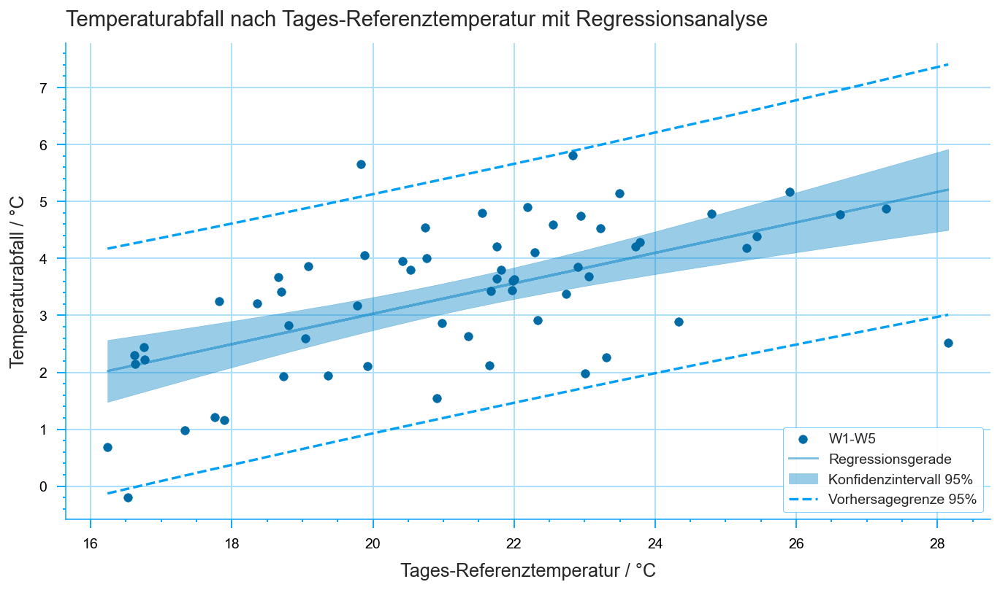

In [17]:
dtd.plot_scatter(
    sensor_manual=SENSORS,
    title="Temperaturabfall nach Tages-Referenztemperatur mit Regressionsanalyse",
    scatter_label="W1-W5",
    file_export=True,
    fig_legend_loc="lower right",
    file_export_path="graphics_report",
    file_export_type=("pdf", "png", "svg", ),
)

### COMPARISON

In [14]:
cmp_wtdl_sht = wl.Compare(
    dtd.dateseries,
    dtd.dateseries,
    sensor_manual=SENSORS,
)

image was saved at graphics_report/Muster_Gegenüberstellung_zweier_Messungen_Vergleich_Sensortypen_WTDL1_und_SHT31_im_selben_Zeitraum_W1W2W3W4W5_size-10-6.pdf
image was saved at graphics_report/Muster_Gegenüberstellung_zweier_Messungen_Vergleich_Sensortypen_WTDL1_und_SHT31_im_selben_Zeitraum_W1W2W3W4W5_size-10-6.png
image was saved at graphics_report/Muster_Gegenüberstellung_zweier_Messungen_Vergleich_Sensortypen_WTDL1_und_SHT31_im_selben_Zeitraum_W1W2W3W4W5_size-10-6.svg


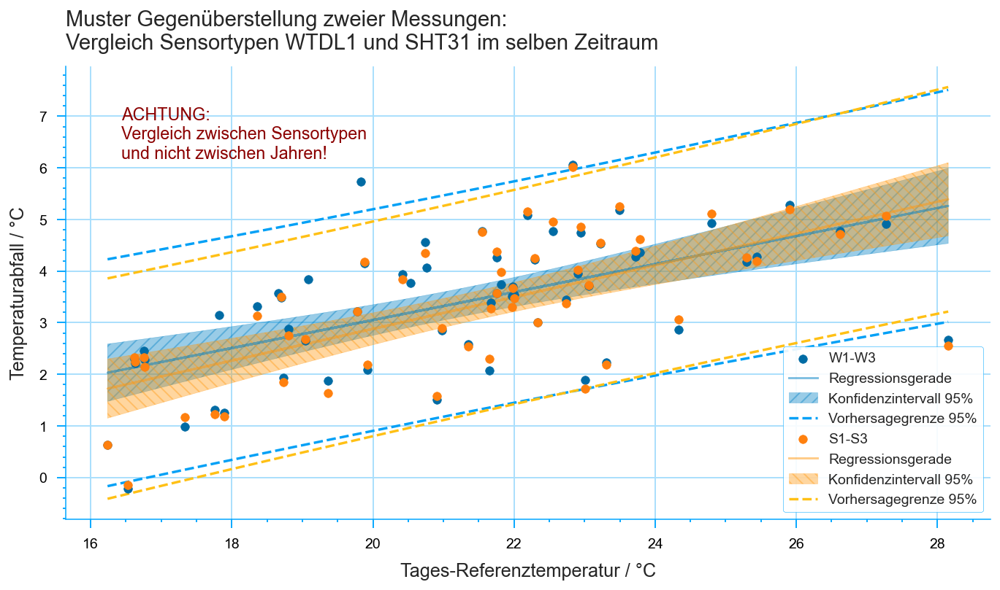

In [22]:
def watermark(fig, ax):
    
    ax.text(
        0.06,
        0.85,
        'ACHTUNG:\nVergleich zwischen Sensortypen\nund nicht zwischen Jahren!',
        horizontalalignment='left',
        verticalalignment='center',
        transform=ax.transAxes,
        c="darkred",
        size="large",
    )
    return fig, ax

cmp_wtdl_sht.plot_scatter(
    title="Muster Gegenüberstellung zweier Messungen:\nVergleich Sensortypen WTDL1 und SHT31 im selben Zeitraum",
    selection_1=("W1","W2", "W3",),
    selection_2=("S1","S2", "S3",),
    scatter_labels=("W1-W3", "S1-S3",),
    fig_legend_loc="lower right",
    annot_func=watermark,
    file_export=True,
    file_export_path="graphics_report",
    file_export_type=("pdf", "png", "svg", ),
)